## [프로젝트] CIFAR-10 이미지 생성하기
앞서 배운 FASHION-MNIST 데이터 생성용 DCGAN 모델 구조를 이용해 CIFAR-10 데이터를 생성하는 모델을 만들어보자. 몇 가지 달라지는 점이 있다. <br/>

- 이미지 데이터의 shape가 (28, 28, 1)에서 (32, 32, 3)으로 변경된다. 생성자, 판별자 모델의 입출력 shape 및 모델 구조에 영향이 있다.
- 이미지가 단색의 grayscale에서 RGB 3채널의 컬러 이미지로 변경된다. 시각화 과정에서 고려할 점이 있다.
- 입력 데이터 전체 차원이 3~4배 증가하며, 학습이 진행되는 양상이 다소 달라진다.

CIFAR-10 데이터셋에 대한 간략한 설명

### Step 1. 작업 환경 구성하기

In [1]:
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/generated_samples
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_checkpoints
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_history

### Step 2. 데이터셋 구성하기
CIFAR-10 데이터셋도 마찬가지로 `tf.keras` 안에 있는 `datasets`에 포함되어 있다. <br/>
- 마찬가지로 각 이미지가 어떤 카테고리인지 나타내주는 라벨이 필요하지 않으므로 y값은 `_`(언더스코어)로 무시해주자.

In [2]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

print("tensorflow", tf.__version__)

tensorflow 2.6.0


In [3]:
(train_x, _), (test_x, _) = tf.keras.datasets.cifar10.load_data()

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

170508288/170498071 [==============================] - 3s 0us/step
max pixel: 255
min pixel: 0


In [4]:
print(train_x.shape)

(50000, 32, 32, 3)


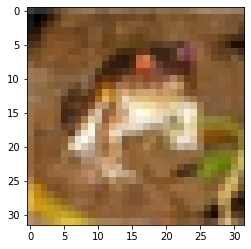

In [5]:
plt.imshow(train_x[0])
plt.show()

> 학습에 사용할 `train_x`의 이미지를 -1, 1로 정규화하자.

In [6]:
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


> 로드한 학습 데이터를 시각화를 통해 확인해보자. <br/>컬러이미지이므로 cmap='gray'를 할 필요 없다.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


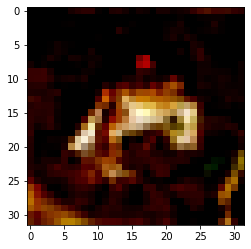

In [7]:
plt.imshow(train_x[0])
plt.show()

> imshow() 함수는 컬러 이미지의 경우 [0, 1] or [0, 255] 범위만 제대로 인식한다. 따라서 [-1, 1]로 변형한 이미지를 다시 1을 더하고 2로 나누어 [0, 1] 사이로 변형해야 원본대로 출력된다.

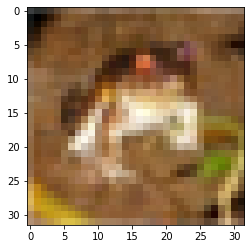

In [8]:
plt.imshow((train_x[0] + 1) / 2.0)
plt.show()

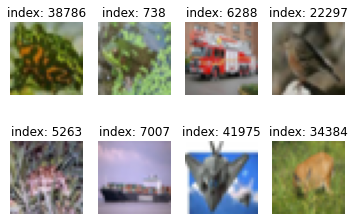

In [9]:
# train image는 랜덤으로 설정
plt.figure(figsize=(6, 4))

for i in range(8):
    plt.subplot(2, 4, i+1)
    random_index = np.random.randint(1, 50000)
    plt.imshow((train_x[random_index]+1) / 2.0)
    plt.title(f'index: {random_index}')
    plt.axis('off')

plt.show()

> tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용해 미니배치 데이터셋을 구성해자.

In [10]:
BUFFER_SIZE = 50000 # 전체 데이터 섞기 (데이터 사이즈와 같게(or 크게) 설정)
BATCH_SIZE = 256 # 한 번에 학습할 데이터의 양

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_dataset

<BatchDataset shapes: (None, 32, 32, 3), types: tf.float64>

In [11]:
# def load_data(label=None):
#     (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()
#     if label:
#         df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label']) 
#         df = df[df['label']==label]
#         train_x = np.array([i for i in list(df['image'])])
#         df = pd.DataFrame(list(zip(train_x, train_y)), columns =['image', 'label']) 
#         df = df[df['label']==label]
#         test_x = np.array([i for i in list(df['image'])])
#     return train_x, test_x

### Step 3. 생성자 모델 구현하기

> (32, 32, 3)의 shape을 가진 이미지를 생성하는 모델 구현 함수 작성하기

In [12]:
# def make_generator_model():

#     # Start
#     model = tf.keras.Sequential()

#     # First: Dense layer
#     model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Second: Reshape layer
#     model.add(layers.Reshape((8, 8, 256)))

#     # Third: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Fourth: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Fifth: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
#                                      activation='tanh'))

#     return model


#4
# def make_generator_model():

#     # Start
#     model = tf.keras.Sequential()

#     # First: Dense layer
#     model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(100,)))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Second: Reshape layer
#     model.add(layers.Reshape((4, 4, 256)))

#     # Third: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(128, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Fourth: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Fifth: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(3, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False, \
#                                      activation='tanh'))

#     return model


#5
# def make_generator_model():

#     # Start
#     model = tf.keras.Sequential()

#     # First: Dense layer
#     model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Second: Reshape layer
#     model.add(layers.Reshape((8, 8, 256)))

#     # Third: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(128, kernel_size=(4, 4), strides=(1, 1), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Fourth: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(64, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU(alpha=0.2))

#     # Fifth: Conv2DTranspose layer
#     model.add(layers.Conv2DTranspose(3, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False, \
#                                      activation='tanh'))

#     return model


# 6
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(4*4*256, use_bias=False, input_shape=(100,)))
#     model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Second: Reshape layer
    model.add(layers.Reshape((4, 4, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
#     model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

앞선 예제에선 `Conv2DTranspose` 층에서 `(7, 7, 256) -> (14, 14, 64) -> (28, 28, 1)` 형태로 이미지를 키워나갔다. <br/> <br/>

이번 예제는 (32, 32, 3)의 shape을 만들어야 한다. 따라서 `(8, 8, 256) -> (16, 16, 64) -> (32, 32, 3)` 으로 키워나갈 수 있도록 하자.

In [13]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4096)              409600    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 4096)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         524288    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 128)       409600    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 128)       0

> `noise = tf.random.normal([1, 100])` 로 생성된 랜덤 노이즈를 입력으로 하여 구현한 생성자로 랜덤 이미지를 생성해보자.

In [14]:
noise = tf.random.normal([1, 100])

> 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인해보자.

In [15]:
generated_image = generator(noise, training=False) # 훈련 중이 아니므로 training=False
generated_image.shape

TensorShape([1, 32, 32, 3])

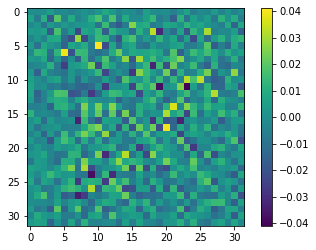

In [16]:
# matplotlib 라이브러리는 2차원 이미지만 보여줄 수 있으므로 0, 3번째 인덱스는 0으로 설정
plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

### Step 4. 판별자 모델 구현하기

> (32, 32, 3)의 이미지를 입력으로 받아 1dim의 판별결과를 출력하는 판별자 모델 구현 함수 작성하기

In [21]:
# def make_discriminator_model():

#     # Start
#     model = tf.keras.Sequential()

#     # First: Conv2D Layer
#     model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[28, 28, 1]))
#     model.add(layers.LeakyReLU())
#     model.add(layers.Dropout(0.3))

#     # Second: Conv2D Layer
#     model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
#     model.add(layers.LeakyReLU())
#     model.add(layers.Dropout(0.3))

#     # Third: Flatten Layer
#     model.add(layers.Flatten())

#     # Fourth: Dense Layer
#     model.add(layers.Dense(1))

#     return model



# 4
# 판별자 모델
# def make_discriminator_model():

#     # Start
#     model = tf.keras.Sequential()

#     # First: Conv2D Layer
#     model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
#     model.add(layers.LeakyReLU(alpha=0.2))
#     model.add(layers.Dropout(0.3))

#     # Second: Conv2D Layer
#     model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
#     model.add(layers.LeakyReLU(alpha=0.2))
#     model.add(layers.Dropout(0.3))
    
#     # Second: Conv2D Layer
#     model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
#     model.add(layers.LeakyReLU(alpha=0.2))
#     model.add(layers.Dropout(0.3))
    
#     # Third: Flatten Layer
#     model.add(layers.Flatten())

#     # Fourth: Dense Layer
#     model.add(layers.Dense(1))

#     return model


# 5
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))
#     model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
#     model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
#     model.add(layers.Dropout(0.3))

    # Third: Flatten Layer
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

`(32, 32, 3) -> (16, 16, 64) -> (8, 8, 128)`

> 앞서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인해보자.

In [23]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 16, 16, 64)        1792      
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 8, 8, 128)         73856     
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 4, 4, 256)         295168    
_________________________________________________________________
leaky_re_lu_14 (LeakyReLU)   (None, 4, 4, 256)         0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 4096)             

In [24]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.00016607]], dtype=float32)>

### Step 5. 손실함수와 최적화 함수 구현하기

> 생성자와 판별자의 손실함수(loss)를 구현하기

In [25]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [26]:
# fake_output이 1에 가까울수록 (What generator wants) 작은 값을 가진다.
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [27]:
# real은 1에, fake는 0에 가깝길 원함.
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    
    return total_loss

> 판별자의 출력값을 통해 accuracy를 계산하는 함수 구현하기

In [28]:
# 판별자 정확도 판별 - 둘 다 0.5에 가까운 것이 이상적이다.
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    
    return real_accuracy, fake_accuracy

> 생성자와 판별자를 최적화하는 optimizer 정의하기 <br/>

-> 바꿔보는 건 어뗘

In [29]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [30]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

### Step 6. 훈련과정 상세 기능 구현하기
> 1개 미니배치 훈련 과정 처리하는 `train_step()` 함수 구현하기

In [31]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

> 16개의 고정된 seed를 입력으로 해 훈련 과정 동안 생성한 이미지를 시각화하는 `generate_and_save_images()` 함수 구현하기

In [32]:
# def generate_and_save_images(model, epoch, it, sample_seeds):

#     predictions = model(sample_seeds, training=False)

#     fig = plt.figure(figsize=(4, 4))
#     for i in range(predictions.shape[0]):
#         plt.subplot(4, 4, i+1)
#         plt.imshow(predictions[i, :, :, 0], cmap='gray')
#         plt.axis('off')
   
#     plt.savefig('{}/aiffel/dcgan_newimage/fashion/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
#                     .format(os.getenv('HOME'), epoch, it))

#     plt.show()

In [33]:
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        
        np_generated = predictions.numpy() ####
        np_generated = (np_generated * 127.5) + 127.5   #####역정규화를 하여 이미지를 출력
        np_generated = np_generated.astype(int) ####
        
        plt.subplot(4, 4, i+1)
#         plt.imshow(predictions[i, :, :, 0]) # gray 지우기
        plt.imshow(np_generated[i]) ######
        plt.axis('off')

#     for i in range(predictions.shape[0]):
#         plt.subplot(4, 4, i+1)
#         plt.imshow((predictions[i]+1)/2.0)
#         plt.axis('off')
   
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

> 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy 히스토리(history)를 그래프로 시각화하는 `draw_train_history()` 함수를 구현해 봅시다.

In [34]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6 으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

> `training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해 봅시다.

In [35]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [36]:
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/generated_samples
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_checkpoints
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_history

### Step 7. 학습 과정 진행하기
> 위 STEP 5에서 구현한 기능들을 활용하여 최소 50 epoch만큼의 모델 학습을 진행해 봅시다.

In [37]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [38]:
save_every = 5
EPOCHS = 80

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

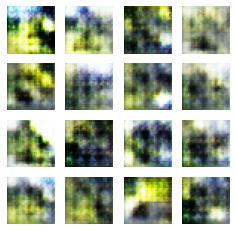

Time for training : 1207 sec


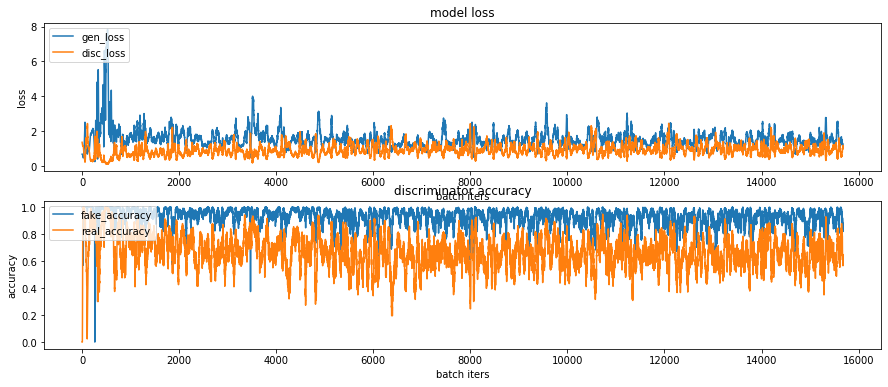

CPU times: user 20min 54s, sys: 2min 10s, total: 23min 5s
Wall time: 20min 8s


In [39]:
%%time

with tf.device('/GPU:0'):
    train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/dcgan_newimage/cifar10/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인해 보시길 권합니다.

> 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.

In [40]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan6.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan6.gif

-rw-r--r-- 1 root root 1373281 Feb 13 05:41 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan6.gif


In [41]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# # 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
# noise = tf.random.normal([1, 100])
# generated_image = generator(noise, training=False)

# np_generated = generated_image.numpy()
# np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
# np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0])
# plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.


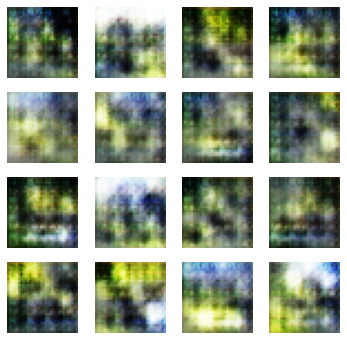

In [42]:
# 로드한 모델이 정상적으로 이미지를 생성하는지 확인. 
plt.figure(figsize=(6, 6))

for i in range(16):
    plt.subplot(4, 4, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)
    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   #역정규화를 하여 이미지를 출력
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
plt.show()

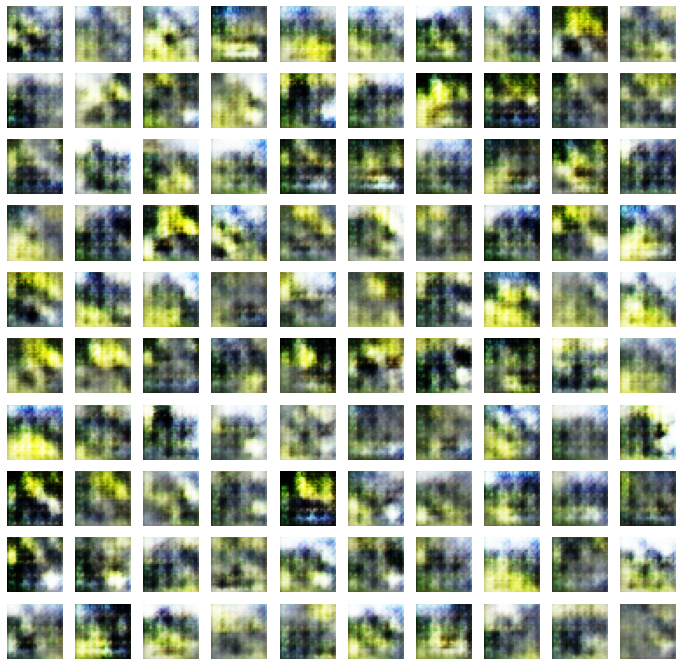

In [43]:
# 로드한 모델이 정상적으로 이미지를 생성하는지 확인. 
plt.figure(figsize=(12, 12))

for i in range(100):
    plt.subplot(10, 10, i+1)
    noise = tf.random.normal([1, 100])
    generated_image = generator(noise, training=False)
    np_generated = generated_image.numpy()
    np_generated = (np_generated * 127.5) + 127.5   #역정규화를 하여 이미지를 출력
    np_generated = np_generated.astype(int)
    plt.imshow(np_generated[0])
    plt.axis('off')
plt.show()

***

## 성능 개선

(1) 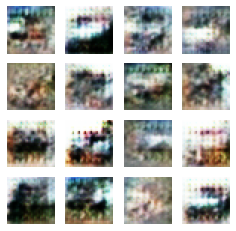 

(2) 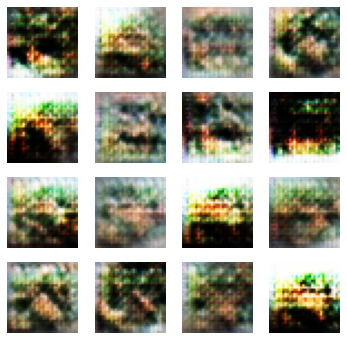

(3)
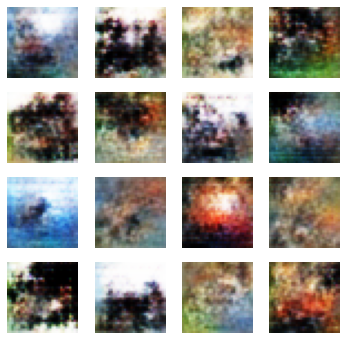

(4)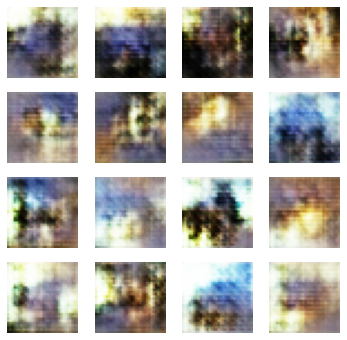

(5)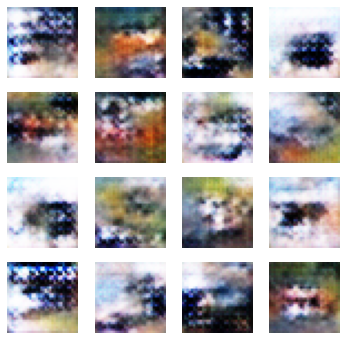

(1)
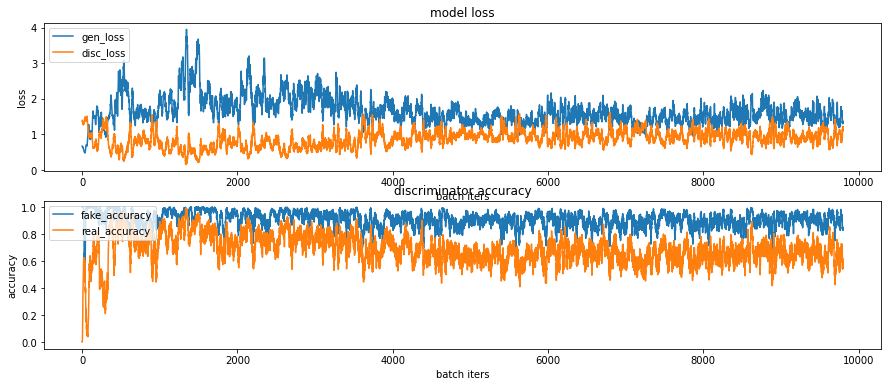

(2)
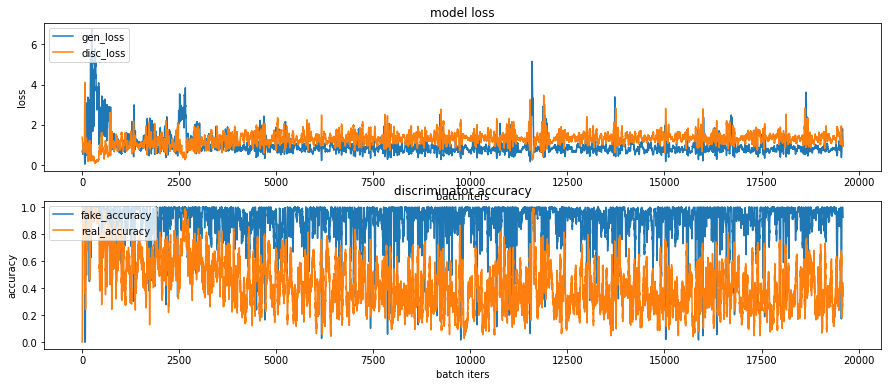

(3)
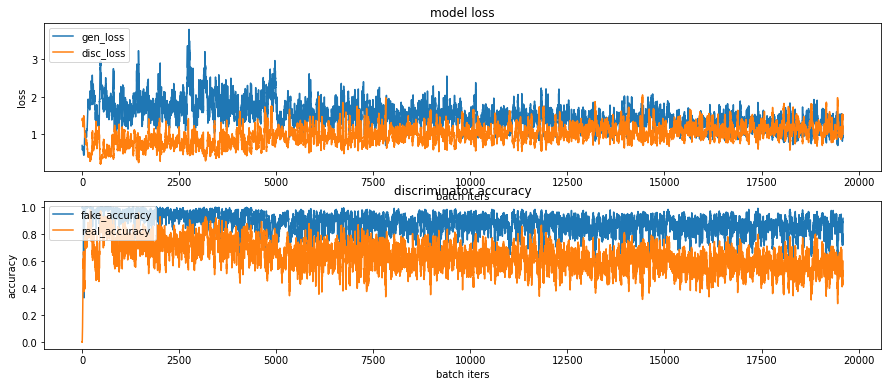

(4)
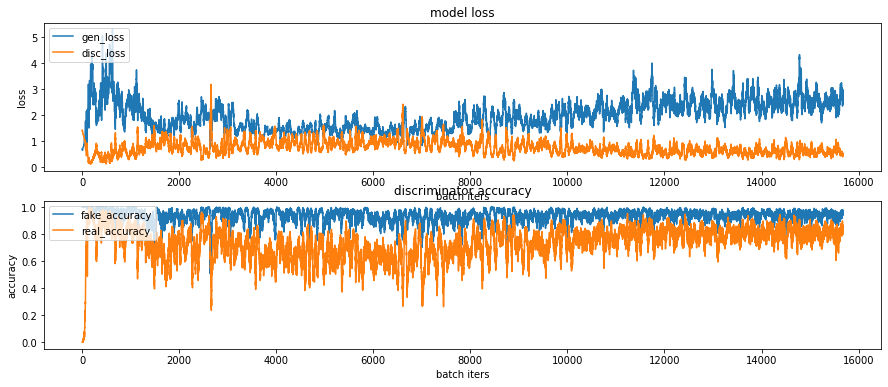

(5)
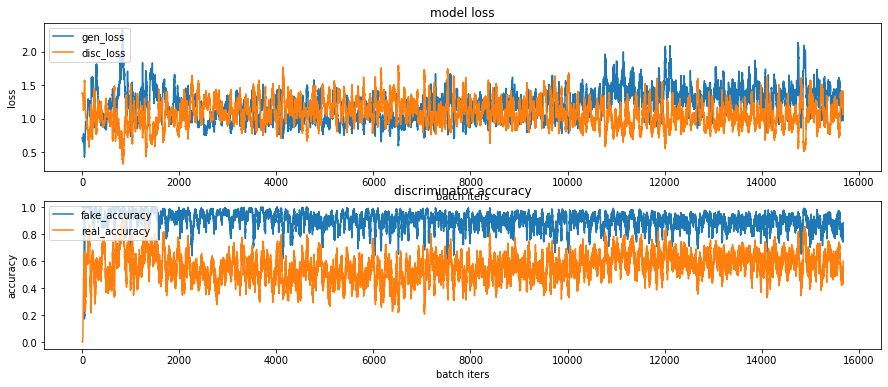

(1)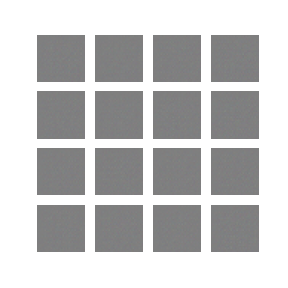

(2)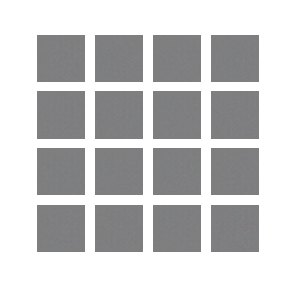

(3)
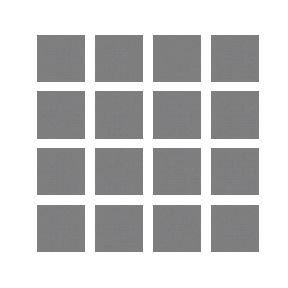

(4) 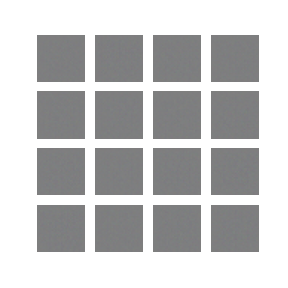

(5)
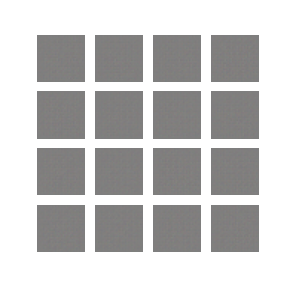

어떤 값을 변경해야 하는지 헷갈렸다.